<a href="https://colab.research.google.com/github/ranitha84/generative-adversial-network/blob/main/DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## MNIST Digits Generation using DCGAN


*   In this Notebook we'll build a DCGAN Model to produce MNIST digits
*   Objective - Generating new MNIST images to augment the size of the dataset.

## Pipeline
Steps Involved

- Importing Libraries
- Data Loading and Visualization
- Data Preprocessing
- Model Building
- Model Training
- Generating a GIF of Generated Images

## Importing Libraries
Important Libraries and their versions

- numpy - 1.19.2
- tensorflow - 2.4.1
- matplotlib - 3.3.2
- skimage - 0.17.2

In [ ]:
#Importing necessary Libraries.
import tensorflow as tf
import matplotlib.pyplot as plt
import glob # to find certain directories
import imageio
from IPython import display
from skimage.transform import resize
import numpy as np
import os # to access the folders and files

### Data Loading and Visualization
1. Data Loading
2. Data Visualization

## Loading Image

In [ ]:
(train_x,train_y),(test_x,test_y)= tf.keras.datasets.mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


## Vizualize data set

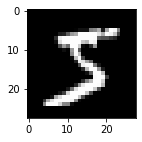

In [ ]:
plt.figure(figsize=(2, 2))
plt.imshow(train_x[0], cmap='gray')
# plt.axis('off')
plt.show()

In [ ]:
print(train_y[0])

5


### Data Preprocessing


1.   Normalization of Images
2.   Resize Images
1.   Reshape Images
2.   Shuffle Data

#### Declare Buffer Size, Batch Size and Dimensions of Noise


In [ ]:
BUFFER_SIZE = len(train_x)
BATCH_SIZE = 2048
NOISE_DIM = 100

***Normalization of Images***

In [ ]:
train_dataset= (train_x/127.5)-1

Reshape and *Resize* images to nearest power of 2

In [ ]:
train_images= np.zeros((BUFFER_SIZE, 32,32))
for index, img in enumerate(train_dataset):
  train_images[index,:,:]= resize(img, (32,32))

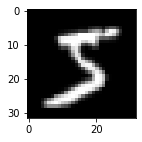

In [ ]:
plt.figure(figsize=(2,2))
plt.imshow(train_images[0],cmap='gray')

plt.show()

## Reshape the images


In [ ]:
train_images = train_images.reshape(train_images.shape[0],32,32,1).astype('float32')

#### Shuffle the data and store in Batches
shuffle - Randomly shuffles the elements of this dataset.

batch - Combines consecutive elements of this dataset into batches.

In [ ]:
train_dataset= tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE,seed=42).batch(BATCH_SIZE)

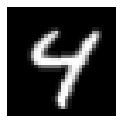

In [ ]:
sample = next(iter(train_dataset))
plt.figure(figsize=(2,2))

plt.imshow(sample[0].numpy()[:,:,0], cmap='gray')
plt.axis('off')
plt.show()

### Model Building


1.   Generator Model Building
2.   Discriminator Model Building

#### Generator Model Building using Transposed Convolutional Layers


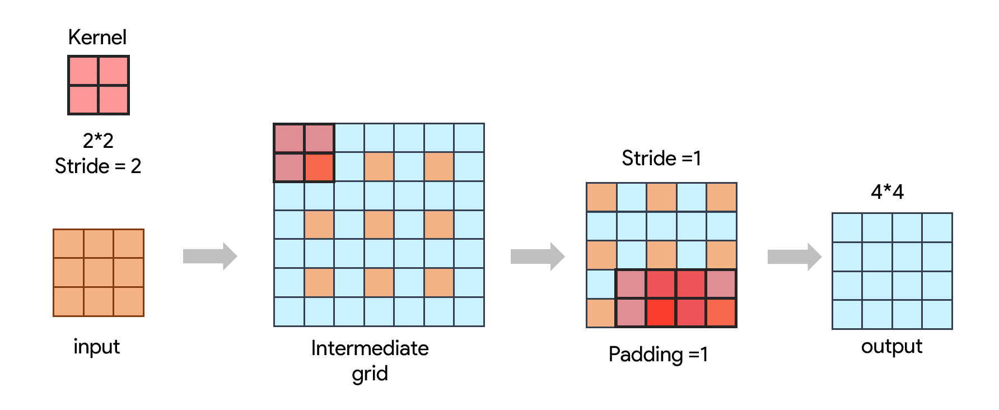

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(4*4*128, use_bias=False, input_shape=(NOISE_DIM,))) # 1-D
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Reshape((4, 4, 128)))

    model.add(tf.keras.layers.Conv2DTranspose(128, (3, 3), strides=(2, 2), use_bias=False, padding='same'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), use_bias=False, padding='same'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Conv2DTranspose(1, (3, 3), strides=(2, 2), use_bias=False, padding='same', activation='tanh'))

    return model

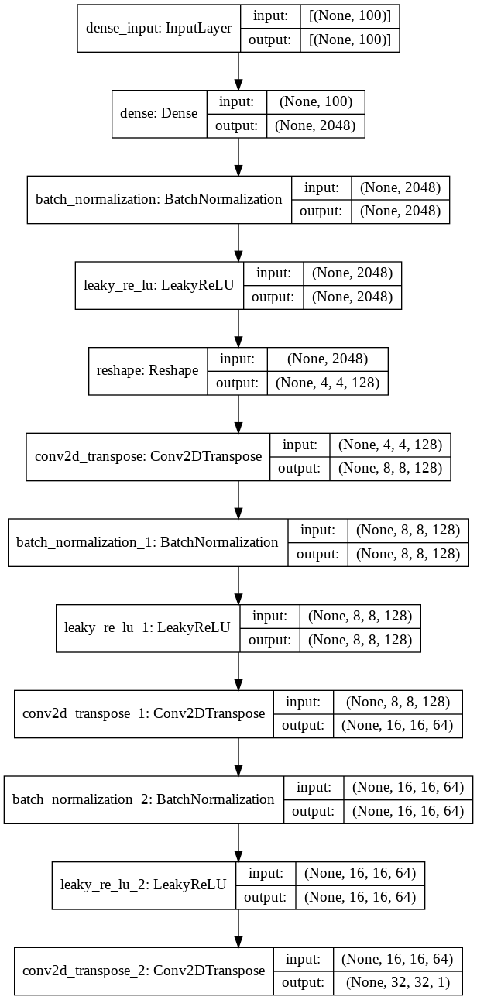

In [ ]:
generator = make_generator_model()
tf.keras.utils.plot_model(
    generator, show_shapes=True, 
    show_layer_names=True
)

In [ ]:
constant_noise = tf.random.normal([1,NOISE_DIM])

generated_image = generator(constant_noise,training=False)



In [ ]:
generated_image

<tf.Tensor: shape=(1, 32, 32, 1), dtype=float32, numpy=
array([[[[-0.01509164],
         [-0.00056299],
         [-0.00298992],
         ...,
         [ 0.01921981],
         [-0.00625368],
         [ 0.00313248]],

        [[-0.00403441],
         [-0.00477461],
         [-0.01008491],
         ...,
         [-0.00613182],
         [ 0.02536519],
         [ 0.00032401]],

        [[-0.00536086],
         [-0.00417907],
         [-0.01771308],
         ...,
         [-0.01442562],
         [ 0.00746628],
         [ 0.00487051]],

        ...,

        [[-0.01027136],
         [ 0.00630057],
         [-0.04393314],
         ...,
         [ 0.03701537],
         [ 0.03084005],
         [ 0.00042398]],

        [[ 0.01226953],
         [-0.01734765],
         [-0.00034054],
         ...,
         [-0.03237318],
         [-0.01897816],
         [ 0.01187931]],

        [[-0.00982277],
         [-0.00080166],
         [ 0.00286742],
         ...,
         [-0.00746852],
         [ 0.0108936

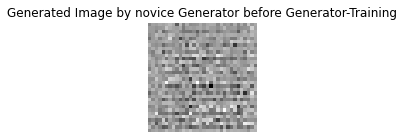

In [ ]:
plt.figure(figsize=(2,2))
plt.imshow(generated_image[0,:,:,0],cmap='gray')
plt.title('Generated Image by novice Generator before Generator-Training')

plt.axis('off')
plt.show()

#### Discriminator Model Building using Convolutional Layers


In [ ]:
def model_discriminator_model():
  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Conv2D(16,(3,3),strides=(1,1), use_bias=False,input_shape=[32,32,1]))
  model.add(tf.keras.layers.LeakyReLU())

  model.add(tf.keras.layers.Conv2D(32,(3,3),strides=(1,1), use_bias=False))
  model.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.LeakyReLU())

  model.add(tf.keras.layers.Conv2D(64,(3,3),strides=(1,1), use_bias=False))
  model.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.LeakyReLU())

  model.add(tf.keras.layers.Conv2D(128,(3,3),strides=(1,1), use_bias=False))
  model.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.LeakyReLU())

  model.add(tf.keras.layers.Conv2D(256,(5,5),strides=(2,2), use_bias=False))
  model.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.LeakyReLU())

  model.add(tf.keras.layers.Conv2D(1,(10,10), strides =(1,1)))

  model.add(tf.keras.layers.Flatten())

  return model


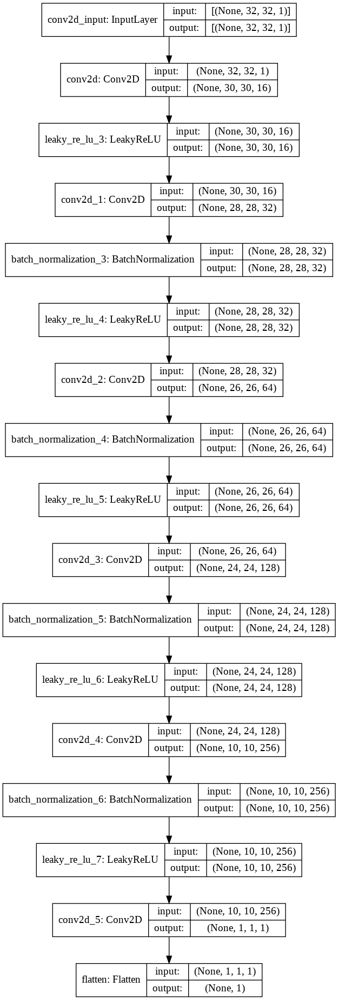

In [ ]:
discriminator= model_discriminator_model()

tf.keras.utils.plot_model(discriminator, show_shapes=True, show_layer_names=True)

In [ ]:
decision = discriminator(generated_image)

print('Decision by Generator without training {}'.format(decision))

Decision by Generator without training [[-3.4205324e-05]]


### Model Training


1.   Loss Type
2.   Discriminator Loss
3.   Generator Loss
4.   Optimizer
5.   Checkpoint Initialization
6.   Training Flow

In [ ]:
cross_entropy= tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Calculate Discriminator Loss
It consists of two types of losses

1.    Loss on Real Data
2.    Loss on Fake Data


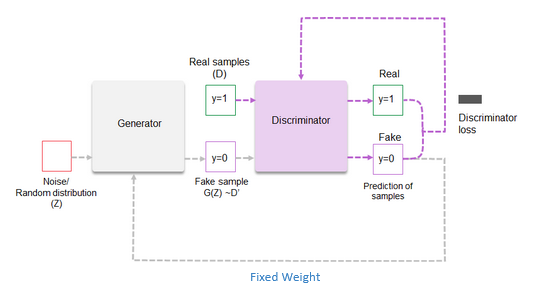

In [ ]:
def discriminator_loss(real_output, fake_output):
  real_loss= cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss= cross_entropy(tf.zeros_like(fake_output), fake_output)

  total_loss = real_loss + fake_loss
  return total_loss

#### Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

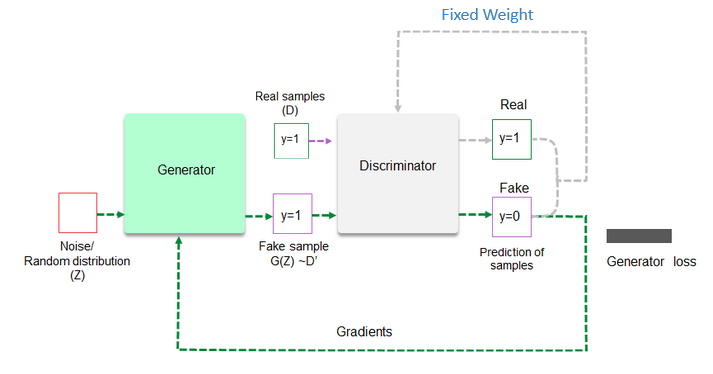

In [ ]:
def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

#### Using Adam Optimizer

In [ ]:
generator_optimizer=tf.keras.optimizers.Adam( learning_rate=1e-4)
discriminator_optimizer=tf.keras.optimizers.Adam( learning_rate=1e-4)

*We* will train our model for 250 epochs

In [ ]:
EPOCHS = 250

#### Checkpoint Initialization Initialize checkpoints to save models

In [ ]:
drive_path = '/content/drive/MyDrive/app/gan'

In [ ]:
if not os.path.isdir(drive_path+'/generator'):
  os.mkdir(drive_path+'/generator')

In [ ]:
checkpoint_dir = drive_path+'/generator/training_checkpoints'

chk= tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                         discriminiator_optimizer= discriminator_optimizer,
                         generator=generator,
                         discriminator= discriminator)

ckpt_manager= tf.train.CheckpointManager(chk, directory=checkpoint_dir, max_to_keep=3)

if ckpt_manager.latest_checkpoint:
  chk.restore(ckpt_manager.latest_checkpoint)
  print('Latest Check point Successful')

Latest Check point Successful


#### Training FLow
Below Function performs one Flow of Batch Training

In [ ]:
@tf.function
def train_step(images):
    # Take Noise
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    # To track the gradients for calculation
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate Fake Image from Noise
        generated_images = generator(noise, training=True)
        
        # Check Discriminator's output for Real and Fake Image
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        
        # Generator's loss on Fake and Discriminator's loss on both Real and Fake
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    # Calculate the Gradients
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply Gradients in the optimizer
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

#### Train the DCGAN Model for several Epochs
Loop training function for number of epochs and also show the output at each step. <p>
Note how Generator is getting better at producing realistic images epoch by epoch

In [ ]:
num_examples_to_generate = 16

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, NOISE_DIM])

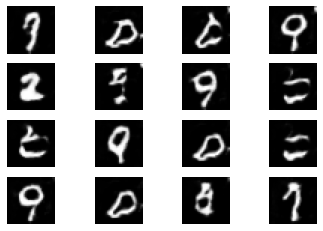

Saving checkpoint for epoch 250 at /content/drive/MyDrive/app/gan/generator/training_checkpoints/ckpt-500


In [ ]:
for epoch in range(EPOCHS+1):
  for image_batch in train_dataset:
    train_step(image_batch)
  
  # Produce images for the GIF as we go
  display.clear_output(wait=True)

  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).

  predictions = generator(seed, training=False)

  for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

  ckpt_save_path = ckpt_manager.save()
  print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)


In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('image*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)


In [ ]:
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-xxsnyd8t
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-xxsnyd8t
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0ab165fda010d80d82548b3797c1eaaf5803a00e8_-py3-none-any.whl size=154264 sha256=5e5188efb8c326674ee682d47c28fdc56a5c92caead0e5430e050a841ec85387
  Stored in directory: /tmp/pip-ephem-wheel-cache-d8z_2xi1/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Failed to build tensorflow-docs
    Running setup.py install for tensorflow-docs ... done
  DEPRECATION: tensorflow-docs was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.



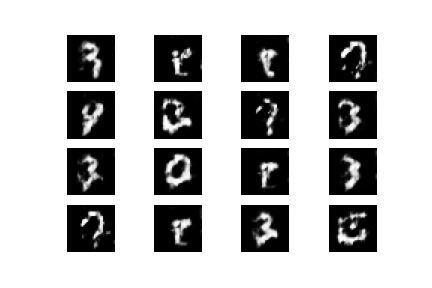

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)